# Sources

* The dataset is from https://www.kaggle.com/datasets/jboysen/ny-home-mortgage

* The notebook is from https://www.kaggle.com/code/ambarish/machine-learning-explainability-omnibus/notebook


In [ ]:
import zipfile
from google.colab import drive

drive.mount('/content/drive/')

Drive already mounted at /content/drive/; to attempt to forcibly remount, call drive.mount("/content/drive/", force_remount=True).


In [ ]:
!unzip -q "/content/drive/My Drive/ny_hmda_2015.csv.zip"

replace ny_hmda_2015.csv? [y]es, [n]o, [A]ll, [N]one, [r]ename: 

# I. Background

1. What is HMDA: Housing mortgage loans are a prevalent type of financial loan in which borrowers use their property as collateral to secure funds from banks or other financial institutions. After borrowers submit their loan applications, banks follow a stringent process to evaluate and approve the application, ensuring the transaction's feasibility for both parties.

2. Context: This data is essential for regulatory bodies, policymakers, and researchers to assess whether financial institutions are serving the housing needs of various communities fairly and equitably.

3. Content: This dataset encompasses mortgage decisions made in 2015 for the state of New York. Data for additional states and years can be accessed through the Consumer Financial Protection Bureau's website. The dataset includes various attributes, such as applicant demographics, loan details, property information, and the outcome of the loan application.

4. Purpose: The primary objective of this analysis is to investigate the fairness of mortgage loan decisions across different ethnicities (e.g., Asian, White, Black), genders (male and female), and income levels. We aim to identify potential disparities and biases in lending practices, which can help inform policy recommendations and enhance transparency in the mortgage lending process.

5. Our Automated Decision System (ADS) evaluates lending decisions based on the information provided by applicants, such as personal demographics (race, gender, income), loan details (amount, purpose), and property characteristics. The system generates an outcome on a scale from 1 to 7, where 1 represents full approval and 7 indicates complete denial. This ADS enables a comprehensive and efficient analysis of mortgage applications, promoting fair lending practices and ensuring compliance with regulatory requirements.

# II. Input and Output

In [ ]:
# import libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

In [ ]:
!pip install fairlearn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
pip install lime

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
from sklearn.preprocessing import MinMaxScaler
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.metrics import accuracy_score, precision_score, recall_score

from fairlearn.postprocessing import ThresholdOptimizer
from fairlearn.preprocessing import CorrelationRemover
from fairlearn.adversarial import AdversarialFairnessClassifier
from fairlearn.metrics import MetricFrame
import fairlearn.datasets as fdata
from fairlearn.metrics import (demographic_parity_difference, demographic_parity_ratio, 
                               selection_rate_difference, false_negative_rate_difference, 
                               false_positive_rate_difference, equalized_odds_ratio,
                               false_negative_rate, false_positive_rate)
from lightgbm import LGBMClassifier

import lime
from lime import lime_tabular
from lime.submodular_pick import SubmodularPick

In [ ]:
# import csv
df = pd.read_csv('ny_hmda_2015.csv')
df.head(5)

<ipython-input-168-71a7ad247259>:2: DtypeWarning: Columns (15,16,17,31,32,33,34,42,43,44) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('ny_hmda_2015.csv')


,action_taken,action_taken_name,agency_code,agency_abbr,agency_name,applicant_ethnicity,applicant_ethnicity_name,applicant_income_000s,applicant_race_1,applicant_race_2,...,state_abbr,state_name,hud_median_family_income,loan_amount_000s,number_of_1_to_4_family_units,number_of_owner_occupied_units,minority_population,population,rate_spread,tract_to_msamd_income
0,1,Loan originated,9,CFPB,Consumer Financial Protection Bureau,2,Not Hispanic or Latino,97.0,5,NaN,...,NY,New York,109000.0,187,363.0,1817.0,21.139999,5870.0,NaN,109.459999
1,1,Loan originated,9,CFPB,Consumer Financial Protection Bureau,2,Not Hispanic or Latino,200.0,5,NaN,...,NY,New York,71300.0,460,53.0,256.0,45.959999,3512.0,NaN,160.600006
2,1,Loan originated,7,HUD,Department of Housing and Urban Development,2,Not Hispanic or Latino,NaN,3,NaN,...,NY,New York,71300.0,296,2745.0,2586.0,38.990002,8357.0,NaN,134.820007
3,1,Loan originated,9,CFPB,Consumer Financial Protection Bureau,2,Not Hispanic or Latino,202.0,5,NaN,...,NY,New York,109000.0,770,1879.0,2147.0,7.350000,6642.0,NaN,165.830002
4,1,Loan originated,9,CFPB,Consumer Financial Protection Bureau,2,Not Hispanic or Latino,255.0,5,NaN,...,NY,New York,109000.0,648,835.0,676.0,30.059999,2339.0,NaN,133.300003


In [ ]:
df.shape

(439654, 78)

* We have 43964 sample size in the data set
* We have 77 independent variable and 1 depnedent variable

Numeric Columns

In [ ]:
[df.dtypes.keys()[i] for i in range(len(df.dtypes.keys())) if df.dtypes.values[i] == 'int64' or df.dtypes.values[i] == 'float64']

['action_taken',
 'agency_code',
 'applicant_ethnicity',
 'applicant_income_000s',
 'applicant_race_1',
 'applicant_race_2',
 'applicant_race_3',
 'applicant_race_4',
 'applicant_race_5',
 'applicant_sex',
 'application_date_indicator',
 'as_of_year',
 'census_tract_number',
 'co_applicant_ethnicity',
 'co_applicant_race_1',
 'co_applicant_race_2',
 'co_applicant_race_3',
 'co_applicant_race_4',
 'co_applicant_race_5',
 'co_applicant_sex',
 'county_code',
 'denial_reason_1',
 'denial_reason_2',
 'denial_reason_3',
 'edit_status',
 'hoepa_status',
 'lien_status',
 'loan_purpose',
 'loan_type',
 'msamd',
 'owner_occupancy',
 'preapproval',
 'property_type',
 'purchaser_type',
 'sequence_number',
 'state_code',
 'hud_median_family_income',
 'loan_amount_000s',
 'number_of_1_to_4_family_units',
 'number_of_owner_occupied_units',
 'minority_population',
 'population',
 'rate_spread',
 'tract_to_msamd_income']

Categorical Columns

In [ ]:
[df.dtypes.keys()[i] for i in range(len(df.dtypes.keys())) if df.dtypes.values[i] != 'int64' and df.dtypes.values[i] != 'float64']

['action_taken_name',
 'agency_abbr',
 'agency_name',
 'applicant_ethnicity_name',
 'applicant_race_name_1',
 'applicant_race_name_2',
 'applicant_race_name_3',
 'applicant_race_name_4',
 'applicant_race_name_5',
 'applicant_sex_name',
 'co_applicant_ethnicity_name',
 'co_applicant_race_name_1',
 'co_applicant_race_name_2',
 'co_applicant_race_name_3',
 'co_applicant_race_name_4',
 'co_applicant_race_name_5',
 'co_applicant_sex_name',
 'county_name',
 'denial_reason_name_1',
 'denial_reason_name_2',
 'denial_reason_name_3',
 'edit_status_name',
 'hoepa_status_name',
 'lien_status_name',
 'loan_purpose_name',
 'loan_type_name',
 'msamd_name',
 'owner_occupancy_name',
 'preapproval_name',
 'property_type_name',
 'purchaser_type_name',
 'respondent_id',
 'state_abbr',
 'state_name']

Missing Values Check

In [ ]:
complete = []
incomplete = []
for i in df.columns:
  if df[i].isna().any() == False:
    complete.append(i)
  else:
    incomplete.append(i)

In [ ]:
print("Columns without Missing Values:")
complete

Columns without Missing Values:


['action_taken',
 'action_taken_name',
 'agency_code',
 'agency_abbr',
 'agency_name',
 'applicant_ethnicity',
 'applicant_ethnicity_name',
 'applicant_race_1',
 'applicant_race_name_1',
 'applicant_sex',
 'applicant_sex_name',
 'application_date_indicator',
 'as_of_year',
 'co_applicant_ethnicity',
 'co_applicant_ethnicity_name',
 'co_applicant_race_1',
 'co_applicant_race_name_1',
 'co_applicant_sex',
 'co_applicant_sex_name',
 'hoepa_status',
 'hoepa_status_name',
 'lien_status',
 'lien_status_name',
 'loan_purpose',
 'loan_purpose_name',
 'loan_type',
 'loan_type_name',
 'owner_occupancy',
 'owner_occupancy_name',
 'preapproval',
 'preapproval_name',
 'property_type',
 'property_type_name',
 'purchaser_type',
 'purchaser_type_name',
 'respondent_id',
 'sequence_number',
 'state_code',
 'state_abbr',
 'state_name',
 'loan_amount_000s']

In [ ]:
print("Columns with Missing Values:")
incomplete

Columns with Missing Values:


['applicant_income_000s',
 'applicant_race_2',
 'applicant_race_3',
 'applicant_race_4',
 'applicant_race_5',
 'applicant_race_name_2',
 'applicant_race_name_3',
 'applicant_race_name_4',
 'applicant_race_name_5',
 'census_tract_number',
 'co_applicant_race_2',
 'co_applicant_race_3',
 'co_applicant_race_4',
 'co_applicant_race_5',
 'co_applicant_race_name_2',
 'co_applicant_race_name_3',
 'co_applicant_race_name_4',
 'co_applicant_race_name_5',
 'county_code',
 'county_name',
 'denial_reason_1',
 'denial_reason_2',
 'denial_reason_3',
 'denial_reason_name_1',
 'denial_reason_name_2',
 'denial_reason_name_3',
 'edit_status',
 'edit_status_name',
 'msamd',
 'msamd_name',
 'hud_median_family_income',
 'number_of_1_to_4_family_units',
 'number_of_owner_occupied_units',
 'minority_population',
 'population',
 'rate_spread',
 'tract_to_msamd_income']

Check Correlations between Independent Variables

In [ ]:
numeric_df = df.select_dtypes(include=['number'])
numeric_df

,action_taken,agency_code,applicant_ethnicity,applicant_income_000s,applicant_race_1,applicant_race_2,applicant_race_3,applicant_race_4,applicant_race_5,applicant_sex,...,sequence_number,state_code,hud_median_family_income,loan_amount_000s,number_of_1_to_4_family_units,number_of_owner_occupied_units,minority_population,population,rate_spread,tract_to_msamd_income
0,1,9,2,97.0,5,NaN,NaN,NaN,NaN,2,...,164811,36,109000.0,187,363.0,1817.0,21.139999,5870.0,NaN,109.459999
1,1,9,2,200.0,5,NaN,NaN,NaN,NaN,1,...,26589,36,71300.0,460,53.0,256.0,45.959999,3512.0,NaN,160.600006
2,1,7,2,NaN,3,NaN,NaN,NaN,NaN,1,...,141383,36,71300.0,296,2745.0,2586.0,38.990002,8357.0,NaN,134.820007
3,1,9,2,202.0,5,NaN,NaN,NaN,NaN,1,...,154957,36,109000.0,770,1879.0,2147.0,7.350000,6642.0,NaN,165.830002
4,1,9,2,255.0,5,NaN,NaN,NaN,NaN,1,...,106528,36,109000.0,648,835.0,676.0,30.059999,2339.0,NaN,133.300003
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
439649,6,9,4,82.0,7,NaN,NaN,NaN,NaN,4,...,106122,36,71300.0,510,948.0,391.0,43.790001,2811.0,NaN,85.279999
439650,6,7,4,NaN,7,NaN,NaN,NaN,NaN,4,...,67794,36,69000.0,98,2287.0,1783.0,6.130000,5984.0,NaN,111.459999
439651,6,7,4,NaN,7,NaN,NaN,NaN,NaN,4,...,68058,36,69700.0,128,1814.0,1655.0,4.140000,5093.0,NaN,129.479996
439652,6,9,4,95.0,7,NaN,NaN,NaN,NaN,4,...,106352,36,109000.0,168,1423.0,1480.0,19.969999,4997.0,NaN,171.649994


In [ ]:
threshold = 0.8
high_corr_pairs = {}
corr_matrix = numeric_df.corr()

for col in corr_matrix.columns:
    for row in corr_matrix.index:
        if abs(corr_matrix.loc[row, col]) >= threshold and row != col:
            high_corr_pairs[(row, col)] = corr_matrix.loc[row, col]

print("Highly correlated pairs (with correlation above {}):".format(threshold))
for pair, value in high_corr_pairs.items():
    print("{} - {}: {}".format(pair[0], pair[1], value))

Highly correlated pairs (with correlation above 0.8):
applicant_sex - applicant_ethnicity: 0.8134676774435808
co_applicant_race_4 - applicant_ethnicity: 0.9999999999999999
co_applicant_race_2 - applicant_race_2: 0.8753131320355828
co_applicant_race_4 - applicant_race_2: 1.0
co_applicant_race_3 - applicant_race_3: 0.9032140615410889
co_applicant_race_4 - applicant_race_3: 1.0
co_applicant_race_2 - applicant_race_4: 1.0000000000000002
co_applicant_race_3 - applicant_race_4: 1.0
co_applicant_race_4 - applicant_race_4: 1.0
census_tract_number - applicant_race_5: -0.843571946595766
sequence_number - applicant_race_5: -0.8130364140165588
applicant_ethnicity - applicant_sex: 0.8134676774435808
lien_status - application_date_indicator: 0.9009666555642599
applicant_race_5 - census_tract_number: -0.843571946595766
co_applicant_race_1 - co_applicant_ethnicity: 0.9301134771086138
co_applicant_sex - co_applicant_ethnicity: 0.9744149017561431
co_applicant_ethnicity - co_applicant_race_1: 0.930113477

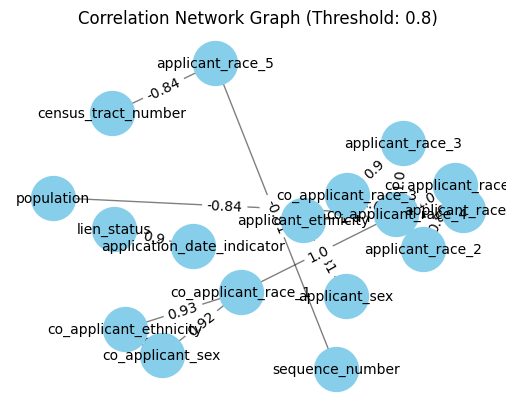

In [ ]:
import networkx as nx
import matplotlib.pyplot as plt

def draw_corr_network(corr_pairs, threshold):
    G = nx.Graph()
    for pair, value in corr_pairs.items():
        if abs(value) >= threshold:
            G.add_edge(pair[0], pair[1], weight=value)
    
    pos = nx.spring_layout(G, k=1.5, iterations=100)
    
    nx.draw_networkx_nodes(G, pos, node_size=1000, node_color='skyblue')
    nx.draw_networkx_edges(G, pos, width=1.0, alpha=0.5)
    edge_labels = nx.get_edge_attributes(G, 'weight')
    for key, value in edge_labels.items():
        edge_labels[key] = round(value, 2)
    nx.draw_networkx_edge_labels(G, pos, edge_labels=edge_labels)
    
    nx.draw_networkx_labels(G, pos, font_size=10, font_family='sans-serif')
    plt.axis('off')
    plt.title("Correlation Network Graph (Threshold: {})".format(threshold))
    plt.show()

threshold = 0.8
draw_corr_network(high_corr_pairs, threshold)

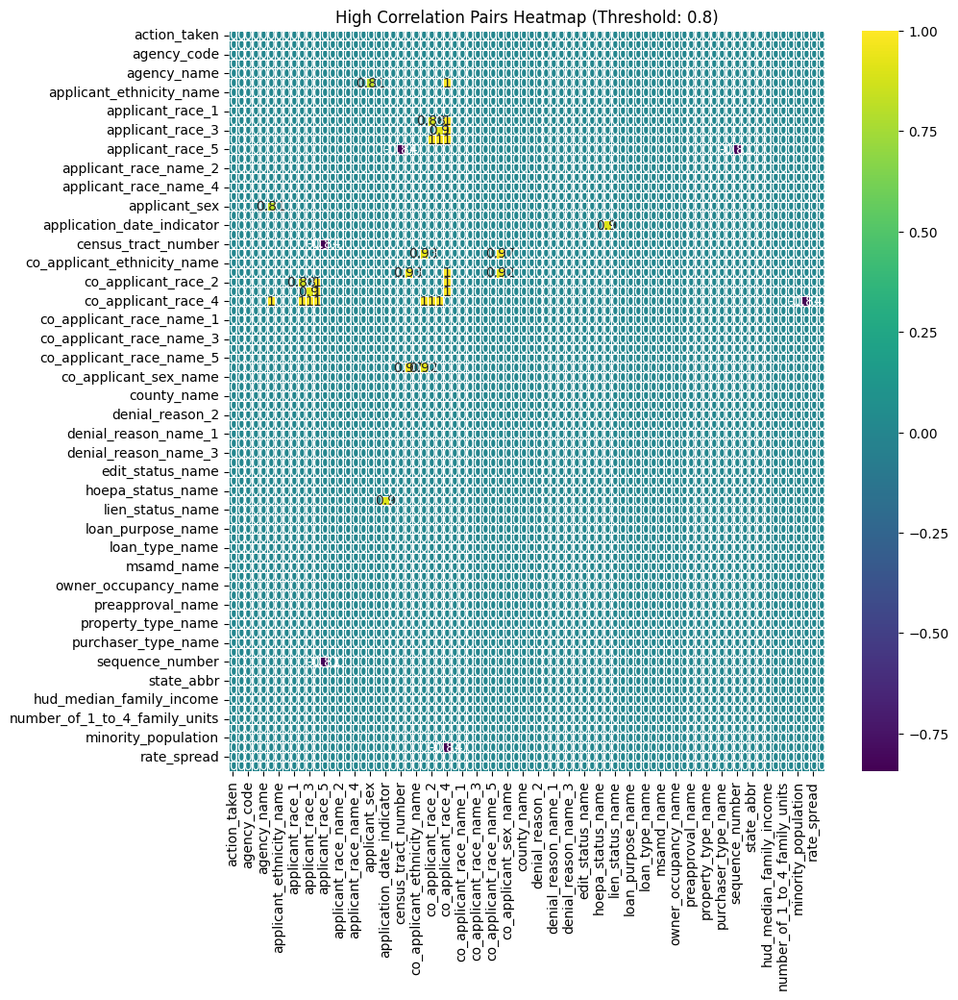

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt

def high_corr_pairs_to_matrix(high_corr_pairs, all_vars):
    corr_matrix = pd.DataFrame(columns=all_vars, index=all_vars).fillna(0)
    for pair, value in high_corr_pairs.items():
        corr_matrix.at[pair[0], pair[1]] = value
        corr_matrix.at[pair[1], pair[0]] = value

    return corr_matrix

threshold = 0.8
high_corr_matrix = high_corr_pairs_to_matrix(high_corr_pairs, df.columns)

plt.figure(figsize=(10, 10))
sns.heatmap(high_corr_matrix, annot=True, cmap='viridis', linewidths=0.5)
plt.title("High Correlation Pairs Heatmap (Threshold: {})".format(threshold))
plt.show()

Output

In [ ]:
df['action_taken_name'].value_counts()

Loan originated                                        228054
Application denied by financial institution             79697
Loan purchased by the institution                       61490
Application withdrawn by applicant                      39496
File closed for incompleteness                          16733
Application approved but not accepted                   14180
Preapproval request denied by financial institution         4
Name: action_taken_name, dtype: int64

The output of the system is a score or class label. 
The y varaible ('action_taken') is numeric ranging from 1 to 7. Each number corresponds to a specific action represented in the column named 'action_taken_name' related to the loan application process. 

Below is the number and corresponding action.

1. Loan originated
2. Application denied by financial institution
3. Loan purchased by the institution
4. Application withdrawn by applicant
5. File closed for incompleteness
6. Application approved but not accepted
7. Preapproval request denied by financial institution

# III. Implementation and Validation

* Let's use the author's filter method to process the data set first.

In [ ]:
# implementation by Kaggle
cols = [f_ for f_ in df.columns if df[f_].dtype != 'object']
features = cols

list_to_remove = ['action_taken','purchaser_type',
                  'denial_reason_1','denial_reason_2','denial_reason_3','sequence_number']

features= list(set(cols).difference(set(list_to_remove)))

X = df[features]
y = df['action_taken']

In [ ]:
print('Shape of input data:', X.shape)
print('Shape of output data:', y.shape)

Shape of input data: (439654, 38)
Shape of output data: (439654,)


After filter, we have 38 independent variables with one dependent variable "action_taken"

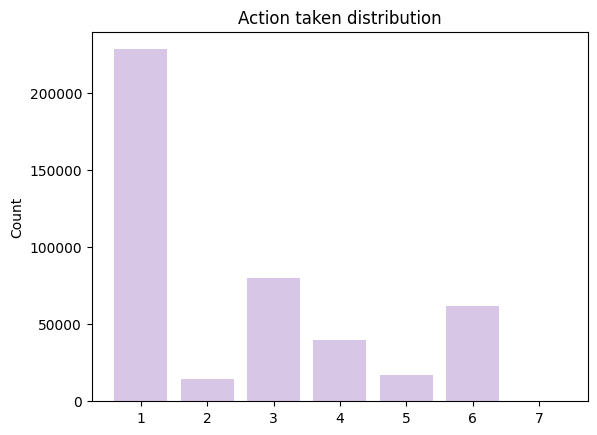

In [ ]:
plt.bar(y.value_counts().index, y.value_counts().values, color = ['#D8C6E7'])
plt.ylabel('Count')
plt.title('Action taken distribution')
plt.show()

In the following sections, we are gonna analyze the fairness between demographic groups based on sex, race, and ranges of income. We will use LGBM  model to evaluate the fariness matrices (FNR, FPN, and differential odds, etc.). We will also include visual representation through graphs to present the results.

In [ ]:
# train-test split
X.fillna(X.mean(), inplace = True)

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size = 0.2)

<ipython-input-209-bedf23b6c2d4>:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  X.fillna(X.mean(), inplace = True)


In [ ]:
lbm = LGBMClassifier(random_state = 1).fit(X_train, y_train)

In [ ]:
y_pred = lbm.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print("Accuracy:", accuracy)

Accuracy: 0.616358280924816


## Sex

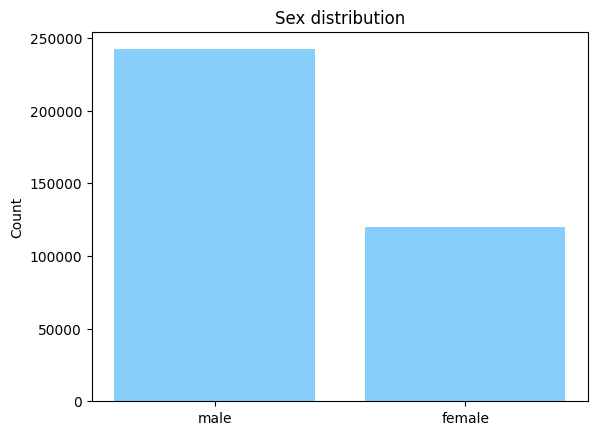

In [ ]:
plt.bar(['male', 'female'], X['applicant_sex'].value_counts().sort_index().iloc[:2], color = 'lightskyblue')
plt.ylabel('Count')
plt.title('Sex distribution')
plt.show()

In [ ]:
sex_indices = X[(X['applicant_sex'] != 3) & (X['applicant_sex'] != 4)].index
X_sex = X.loc[sex_indices]
y_sex = y.loc[sex_indices]

In [ ]:
# train-test split
X_train_sex, X_test_sex, y_train_sex, y_test_sex = train_test_split(X_sex, y_sex, test_size = 0.2)

In [ ]:
# LGBM
lbm_sex = LGBMClassifier(random_state = 1).fit(X_train_sex, y_train_sex)

In [ ]:
y_pred_sex = lbm_sex.predict(X_test_sex)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
import numpy as np

def multiclass_fnr(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    fn = cm.sum(axis=1) - np.diag(cm)
    tp = np.diag(cm)
    fnr = fn / (fn + tp)
    return np.mean(fnr)

def multiclass_fpr(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    fp = cm.sum(axis=0) - np.diag(cm)
    tn = cm.sum() - (fp + cm.sum(axis=1) - np.diag(cm) + np.diag(cm))
    fpr = fp / (fp + tn)
    return np.mean(fpr)

def false_negative_rate_difference(y_true, y_pred, sensitive_features):
    fnr = multiclass_fnr(y_true, y_pred)
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    group_fnr = results.groupby('sensitive_features').apply(lambda group: multiclass_fnr(group.y_true, group.y_pred))
    return group_fnr.max() - group_fnr.min()

def false_positive_rate_difference(y_true, y_pred, sensitive_features):
    fpr = multiclass_fpr(y_true, y_pred)
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    group_fpr = results.groupby('sensitive_features').apply(lambda group: multiclass_fpr(group.y_true, group.y_pred))
    return group_fpr.max() - group_fpr.min()

def demographic_parity_ratio(y_true, y_pred, sensitive_features):
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    selection_rate = results.groupby('sensitive_features')['y_pred'].mean()
    return selection_rate.min() / selection_rate.max()

def equalized_odds_ratio(y_true, y_pred, sensitive_features):
    fpr = multiclass_fpr(y_true, y_pred)
    fnr = multiclass_fnr(y_true, y_pred)
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    group_fpr = results.groupby('sensitive_features').apply(lambda group: multiclass_fpr(group.y_true, group.y_pred))
    group_fnr = results.groupby('sensitive_features').apply(lambda group: multiclass_fnr(group.y_true, group.y_pred))
    
    return max(group_fpr.max() / group_fpr.min(), group_fnr.max() / group_fnr.min())

def selection_rate_difference(y_true, y_pred, sensitive_features):
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    selection_rate = results.groupby('sensitive_features')['y_pred'].mean()
    return selection_rate.max() - selection_rate.min()

sensitive_features_sex = X_test_sex['applicant_sex'].replace({1:'male', 2:'female'})

metric_dict = {
    'accuracy': accuracy_score,
    'precision': lambda y_true, y_pred: precision_score(y_true, y_pred, average='weighted'),
    'recall': lambda y_true, y_pred: recall_score(y_true, y_pred, average='weighted'),
    'FNR': multiclass_fnr,
    'FPR': multiclass_fpr,
    'false_negative_rate_difference': false_negative_rate_difference,
    'false_positive_rate_difference': false_positive_rate_difference,
    'demographic_parity_ratio': demographic_parity_ratio,
    'equalized_odds_ratio': equalized_odds_ratio,
    'selection_rate_difference': selection_rate_difference,
}

sample_params = {
    'accuracy': {},
    'precision': {},
    'recall': {},
    'FNR': {},
    'FPR': {},
    'false_negative_rate_difference': {'sensitive_features': sensitive_features_sex},
    'false_positive_rate_difference': {'sensitive_features': sensitive_features_sex},
    'demographic_parity_ratio': {'sensitive_features': sensitive_features_sex},
    'equalized_odds_ratio': {'sensitive_features': sensitive_features_sex},
    'selection_rate_difference': {'sensitive_features': sensitive_features_sex},
}

metric_frame_sex = MetricFrame(metrics = metric_dict,
                               y_true = y_test_sex,
                               y_pred = y_pred_sex,
                               sensitive_features = sensitive_features_sex,
                               sample_params = sample_params)


In [ ]:
metric_frame_sex.overall

accuracy                          0.622585
precision                         0.539448
recall                            0.622585
FNR                               0.676231
FPR                               0.108883
false_negative_rate_difference    0.007114
false_positive_rate_difference    0.004289
demographic_parity_ratio          0.968159
equalized_odds_ratio              1.040443
selection_rate_difference         0.053583
dtype: float64

In [ ]:
metric_frame_sex.by_group[['accuracy', 'precision', 'recall', 'FNR', 'FPR']]

,accuracy,precision,recall,FNR,FPR
applicant_sex,,,,,
female,0.625168,0.545380,0.625168,0.671633,0.106049
male,0.621315,0.536084,0.621315,0.678746,0.110338


## Race

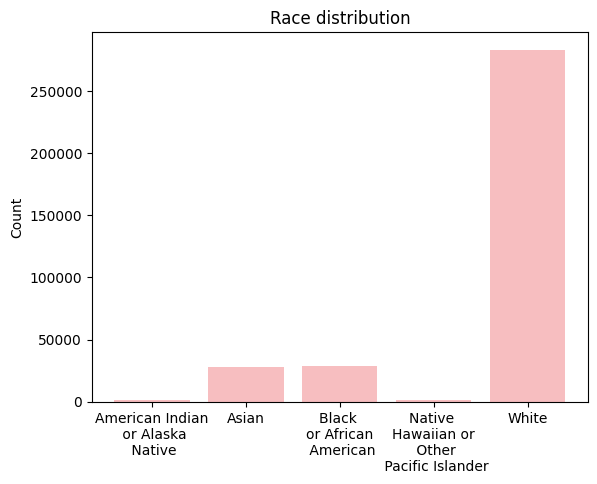

In [ ]:
plt.bar(['American Indian\n or Alaska\n Native', 'Asian', 'Black \nor African\n American', 'Native \nHawaiian or\n Other\n Pacific Islander',
         'White'], X['applicant_race_1'].value_counts().sort_index().iloc[:5], color = ['#F7BEC0'])
plt.ylabel('Count')
plt.title('Race distribution')
plt.show()

In [ ]:
race_indices = X[(X['applicant_race_1'] != 6) & (X['applicant_race_1'] != 7)].index
X_race = X.loc[race_indices]
y_race = y.loc[race_indices]

In [ ]:
# train-test split
X_train_race, X_test_race, y_train_race, y_test_race = train_test_split(X_race, y_race, test_size = 0.2)

In [ ]:
# LGBM
lbm_race = LGBMClassifier(random_state = 1).fit(X_train_race, y_train_race)

In [ ]:
y_pred_race = lbm_race.predict(X_test_race)

In [ ]:
from sklearn.metrics import accuracy_score, precision_score, recall_score, confusion_matrix
import numpy as np

def multiclass_fnr(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    fn = cm.sum(axis=1) - np.diag(cm)
    tp = np.diag(cm)
    fnr = fn / (fn + tp)
    return np.mean(fnr)

def multiclass_fpr(y_true, y_pred):
    cm = confusion_matrix(y_true, y_pred)
    fp = cm.sum(axis=0) - np.diag(cm)
    tn = cm.sum() - (fp + cm.sum(axis=1) - np.diag(cm) + np.diag(cm))
    fpr = fp / (fp + tn)
    return np.mean(fpr)

def false_negative_rate_difference(y_true, y_pred, sensitive_features):
    fnr = multiclass_fnr(y_true, y_pred)
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    group_fnr = results.groupby('sensitive_features').apply(lambda group: multiclass_fnr(group.y_true, group.y_pred))
    return group_fnr.max() - group_fnr.min()

def false_positive_rate_difference(y_true, y_pred, sensitive_features):
    fpr = multiclass_fpr(y_true, y_pred)
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    group_fpr = results.groupby('sensitive_features').apply(lambda group: multiclass_fpr(group.y_true, group.y_pred))
    return group_fpr.max() - group_fpr.min()

def demographic_parity_ratio(y_true, y_pred, sensitive_features):
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    selection_rate = results.groupby('sensitive_features')['y_pred'].mean()
    return selection_rate.min() / selection_rate.max()

def equalized_odds_ratio(y_true, y_pred, sensitive_features):
    fpr = multiclass_fpr(y_true, y_pred)
    fnr = multiclass_fnr(y_true, y_pred)
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    group_fpr = results.groupby('sensitive_features').apply(lambda group: multiclass_fpr(group.y_true, group.y_pred))
    group_fnr = results.groupby('sensitive_features').apply(lambda group: multiclass_fnr(group.y_true, group.y_pred))
    
    return max(group_fpr.max() / group_fpr.min(), group_fnr.max() / group_fnr.min())

def selection_rate_difference(y_true, y_pred, sensitive_features):
    results = pd.DataFrame({'y_true': y_true, 'y_pred': y_pred, 'sensitive_features': sensitive_features})
    selection_rate = results.groupby('sensitive_features')['y_pred'].mean()
    return selection_rate.max() - selection_rate.min()

sensitive_features_race = X_test_race['applicant_race_1'].replace({1:'American Indian or Alaska Native', 2: 'Asian', 3: 'Black or African American', 4: 'Native Hawaiian or Other Pacific Islander',
         5: 'White'})

metric_dict = {
    'accuracy': accuracy_score,
    'precision': lambda y_true, y_pred: precision_score(y_true, y_pred, average='weighted'),
    'recall': lambda y_true, y_pred: recall_score(y_true, y_pred, average='weighted'),
    'FNR': multiclass_fnr,
    'FPR': multiclass_fpr,
    'false_negative_rate_difference': false_negative_rate_difference,
    'false_positive_rate_difference': false_positive_rate_difference,
    'demographic_parity_ratio': demographic_parity_ratio,
    'equalized_odds_ratio': equalized_odds_ratio,
    'selection_rate_difference': selection_rate_difference,
}

sample_params = {
    'accuracy': {},
    'precision': {},
    'recall': {},
    'FNR': {},
    'FPR': {},
    'false_negative_rate_difference': {'sensitive_features': sensitive_features_race},
    'false_positive_rate_difference': {'sensitive_features': sensitive_features_race},
    'demographic_parity_ratio': {'sensitive_features': sensitive_features_race},
    'equalized_odds_ratio': {'sensitive_features': sensitive_features_race},
    'selection_rate_difference': {'sensitive_features': sensitive_features_race},
}

metric_frame_race = MetricFrame(metrics = metric_dict,
                               y_true = y_test_race,
                               y_pred = y_pred_race,
                               sensitive_features = sensitive_features_race,
                               sample_params = sample_params)


/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))
/usr/local/lib/python3.10/dist-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision is ill-defined and being set to 0.0 in labels with no predicted samples. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


In [ ]:
metric_frame_race.overall

accuracy                          0.624408
precision                         0.541627
recall                            0.624408
FNR                               0.677145
FPR                               0.109426
false_negative_rate_difference    0.093310
false_positive_rate_difference    0.010468
demographic_parity_ratio          0.716880
equalized_odds_ratio              1.156329
selection_rate_difference         0.610654
dtype: float64

In [ ]:
metric_frame_race.by_group[['accuracy', 'precision', 'recall', 'FNR', 'FPR']]

,accuracy,precision,recall,FNR,FPR
applicant_race_1,,,,,
American Indian or Alaska Native,0.543417,0.491597,0.543417,0.596881,0.120474
Asian,0.599678,0.488512,0.599678,0.690191,0.117081
Black or African American,0.529038,0.473526,0.529038,0.603977,0.121199
Native Hawaiian or Other Pacific Islander,0.536290,0.484735,0.536290,0.611787,0.121494
White,0.637564,0.551764,0.637564,0.681392,0.111025


## Lime

In [ ]:
feature_names = X_train.columns.tolist()
class_names = ['1: Loan originated', '2: Application approved but not accepted', '3: Application denied by financial institution', '4: Application withdrawn by applicant',
       '5: File closed for incompleteness',
       '6: Loan purchased by the institution',
       '7: Preapproval request denied by financial institution'] 
explainer = lime_tabular.LimeTabularExplainer(X_train.values,
                                              feature_names = feature_names,
                                              class_names = class_names,
                                              discretize_continuous = False)

In [ ]:
sp_obj = SubmodularPick(explainer, X_test.values, lbm.predict_proba, num_exps_desired = 5,  sample_size = 5, num_features = len(feature_names))

In [ ]:
selected_indices = sp_obj.V

In [ ]:
for ind in selected_indices:
    exp = explainer.explain_instance(X_test.values[ind], lbm.predict_proba, num_features=len(feature_names))
    print("Actual class: ", y_test.iloc[ind])
    exp.show_in_notebook(show_all=False)
    print("==========================")

Actual class:  1


Actual class:  4


Actual class:  1


Actual class:  1


Actual class:  3


## Conclusion

We will make conclusions based on the previous findings. Generally, we will try to determine if fairness is maintained between demographic groups of people in HMDA.